In [54]:
#importing libraries

import requests
import zipfile
import io
import os
from google.colab import files

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import numpy as np
import cv2

import tensorflow as tf
import tensorflow.keras as keras
import keras.layers as layers
import PIL.Image as image
from keras.utils.vis_utils import plot_model
from keras.preprocessing.image import ImageDataGenerator



In [2]:
#cloning git directory

!git clone https://github.com/priyansh511/Vehicles-Classification/


Cloning into 'Vehicles-Classification'...
remote: Enumerating objects: 6, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 6 (delta 0), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (6/6), done.


In [3]:
#downloading and extracting zip file

zip=requests.get('https://github.com/priyansh511/Vehicles-Classification/blob/main/vechicle_with_train.zip?raw=true')
zip_file=zipfile.ZipFile(io.BytesIO(zip.content))
zip_file.extractall('/content')

In [4]:
#setting directories

base_dir='/content/vechicles'
train_dir=os.path.join(base_dir,'train')
val_dir=os.path.join(base_dir,'test')




In [5]:
#making training and validation sets
classes=os.listdir(train_dir)
train_images=[]
train_labels=[]
val_images=[]
val_labels=[]



for i in os.listdir(train_dir):
  x=os.path.join(train_dir,i)
  for j in os.listdir(x):
    y=os.path.join(x,j)
    train_images.append(mpimg.imread(y))
    train_labels.append(i)

for i in os.listdir(val_dir):
  x=os.path.join(val_dir,i)
  for j in os.listdir(x):
    y=os.path.join(x,j)
    val_images.append(mpimg.imread(y))
    val_labels.append(i)


In [6]:
print('train images: ', len(train_images))
print('train labels: ', len(train_labels))
print('validtion images: ', len(val_images))
print('validation labels: ', len(val_labels))

train images:  528
train labels:  528
validtion images:  74
validation labels:  74


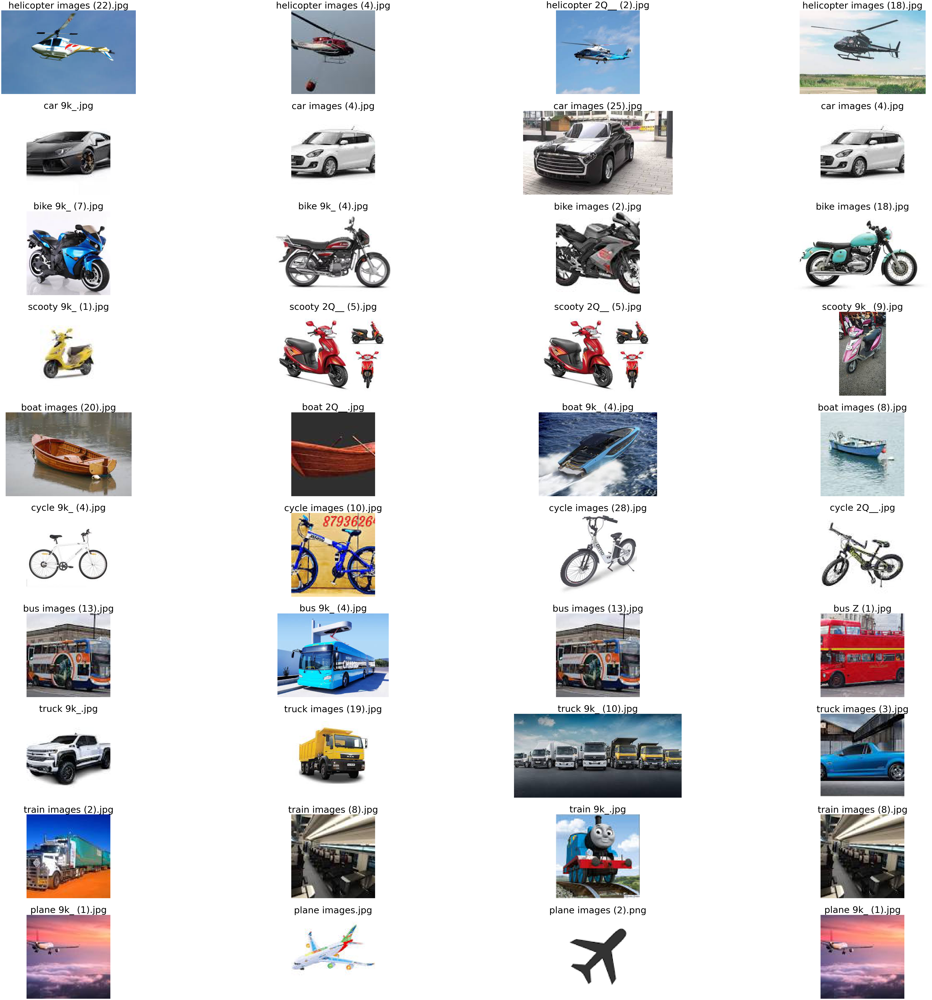

In [7]:
#plotting random images

plot=plt.figure(figsize=(100,100))
randoms=np.random.randint(30,size=(len(classes),4))

for i in range(len(classes)):
  path_= os.path.join(train_dir,classes[i])
  list_=os.listdir(path_)
  for j in range(4):
    img_=os.path.join(path_,list_[randoms[i][j]])
    subp=plt.subplot(len(classes),4,i*4+j+1)
    subp.axis('off')
    plt.imshow(mpimg.imread(img_))
    subp.set_title(classes[i]+' '+ list_[randoms[i][j]],fontdict={'fontsize':50},loc='center')
    

plt.show()

In [8]:
#image augmentation

augmenting=keras.Sequential([
                         layers.experimental.preprocessing.Rescaling(1./255),
                         layers.experimental.preprocessing.Resizing(300,300),
                         layers.experimental.preprocessing.RandomZoom(0.2),
                         layers.experimental.preprocessing.RandomFlip('horizontal_and_vertical'),
                         layers.experimental.preprocessing.RandomRotation(0.1) 
])





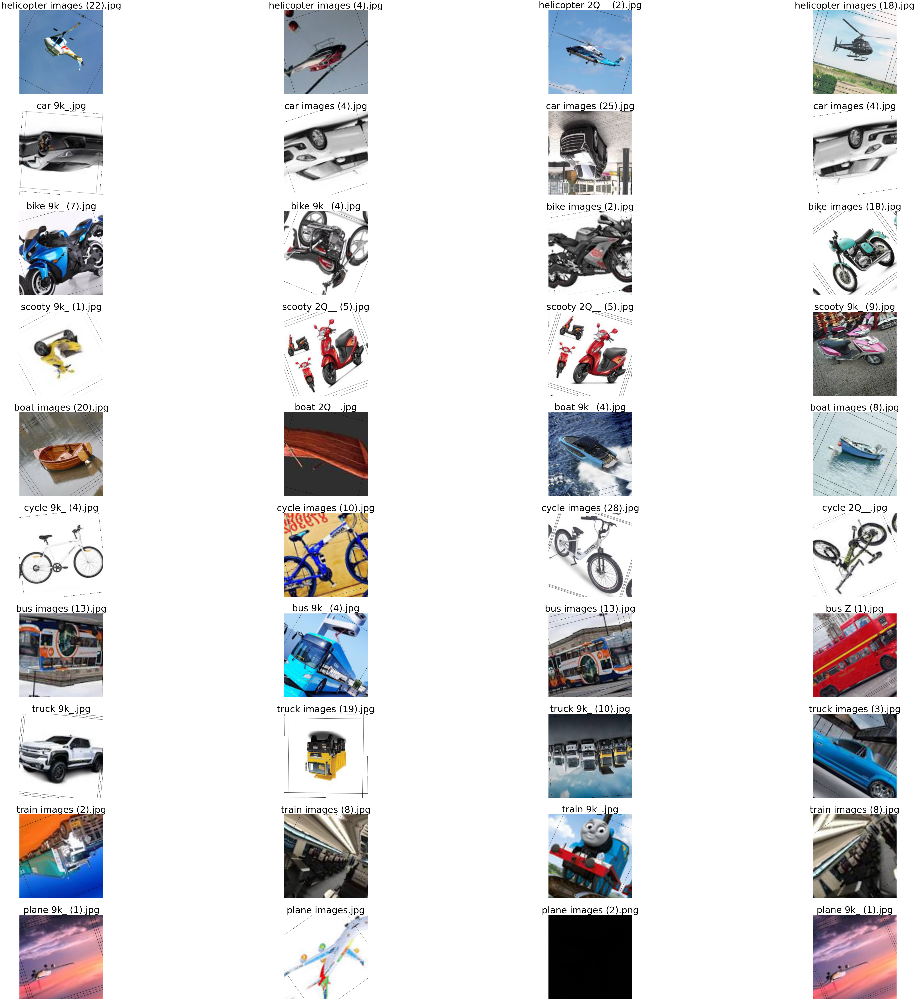

In [9]:
#plotting augmented images

plot=plt.figure(figsize=(100,100))
for i in range(len(classes)):
  path_= os.path.join(train_dir,classes[i])
  list_=os.listdir(path_)
  for j in range(4):
    img_=os.path.join(path_,list_[randoms[i][j]])
    subp=plt.subplot(len(classes),4,i*4+j+1)
    subp.axis('off')
    img_=mpimg.imread(img_)
    img_=tf.expand_dims(img_,0)
    res=augmenting(img_)[0]
    plt.imshow(res)
    subp.set_title(classes[i]+' '+ list_[randoms[i][j]],fontdict={'fontsize':50},loc='center')

In [26]:
#defining custom cnn model

model_custom=keras.Sequential([
                        augmenting,
                        layers.Conv2D(128,(3,3),activation='relu'),
                        layers.MaxPooling2D(2,2),
                        layers.Conv2D(64,(3,3),activation='relu'),
                        layers.MaxPooling2D(2,2),
                         layers.Conv2D(128,(3,3),activation='relu'),
                        layers.MaxPooling2D(2,2),
                        layers.Conv2D(256,(3,3),activation='relu'),
                        layers.MaxPooling2D(2,2),
                        
                        layers.Flatten(),
                        #layers.Dense(512,activation='relu'),
                        layers.Dense(len(classes),activation='softmax')
])

In [27]:
#making training and validation datagenerators

train_datagen=ImageDataGenerator()
val_datagen=ImageDataGenerator()

train_generator=train_datagen.flow_from_directory(
    train_dir,
    class_mode='categorical',
    batch_size=10
)

val_generator=val_datagen.flow_from_directory(
    val_dir,
    class_mode='categorical',
    batch_size=10
)

Found 528 images belonging to 10 classes.
Found 74 images belonging to 10 classes.


In [28]:
#compiling and training custom model

metrices = [
            
       
      'accuracy',
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      
]

model_custom.compile(optimizer=keras.optimizers.RMSprop(lr=0.001),loss='categorical_crossentropy',metrics=metrices)
history_custom=model_custom.fit_generator(
    train_generator,
    epochs=45,
    verbose=1,
    validation_data=val_generator
)

Epoch 1/45
53/53 [==============================] - 4s 78ms/step - loss: 2.6002 - accuracy: 0.1004 - precision: 0.0333 - recall: 0.0019 - val_loss: 2.3304 - val_accuracy: 0.0811 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/45
53/53 [==============================] - 4s 71ms/step - loss: 2.3106 - accuracy: 0.1307 - precision: 0.1667 - recall: 0.0019 - val_loss: 2.2674 - val_accuracy: 0.0676 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/45
53/53 [==============================] - 4s 70ms/step - loss: 2.2828 - accuracy: 0.1742 - precision: 0.2500 - recall: 0.0133 - val_loss: 3.0800 - val_accuracy: 0.1757 - val_precision: 0.3333 - val_recall: 0.0946
Epoch 4/45
53/53 [==============================] - 4s 70ms/step - loss: 2.2424 - accuracy: 0.2254 - precision: 0.2308 - recall: 0.0114 - val_loss: 1.9066 - val_accuracy: 0.2838 - val_precision: 0.6000 - val_recall: 0.0405
Epoch 5/45
53/53 [==============================] - 4s 70ms/step - loss: 2.0584 - accuracy: 

In [13]:
model_custom.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (None, 300, 300, None)    0         
_________________________________________________________________
conv2d (Conv2D)              (None, 298, 298, 128)     3584      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 149, 149, 128)     0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 147, 147, 64)      73792     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 73, 73, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 71, 71, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 35, 35, 128)      

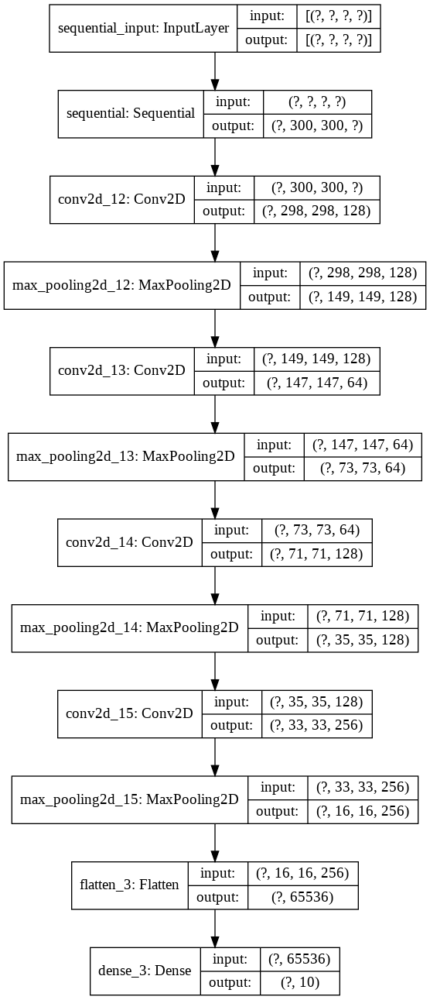

In [57]:
plot_model(model_custom, to_file='model_custom_plot.png', show_shapes=True, show_layer_names=True,)

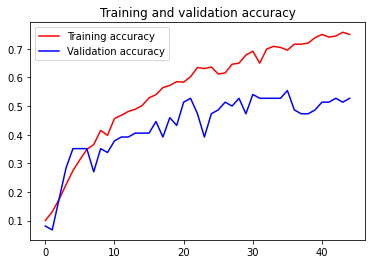

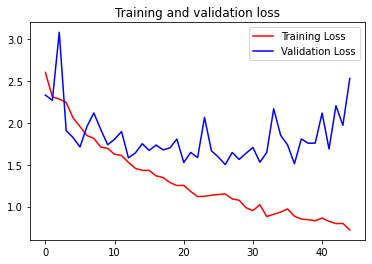

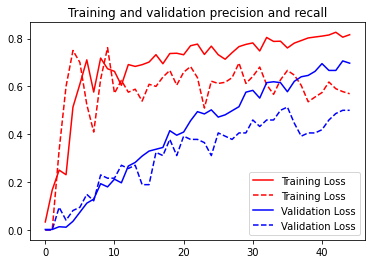

In [52]:
#plotting metrices of custom model

acc = history_custom.history['accuracy']
val_acc = history_custom.history['val_accuracy']
loss = history_custom.history['loss']
val_loss = history_custom.history['val_loss']
precision=history_custom.history['precision']
val_precision=history_custom.history['val_precision']
recall=history_custom.history['recall']
val_recall=history_custom.history['val_recall']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.savefig('model_custom_acc.png')
plt.figure()

plt.plot(epochs, loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()
plt.savefig('model_custom_loss.png')
plt.figure()

plt.plot(epochs, precision, 'r', label='Training Loss')
plt.plot(epochs, val_precision, 'r--', label='Training Loss')
plt.plot(epochs, recall, 'b', label='Validation Loss')
plt.plot(epochs, val_recall, 'b--', label='Validation Loss')
plt.title('Training and validation precision and recall')
plt.legend()
plt.savefig('model_custom_precision_recall.png')
plt.show()


In [34]:
print('accuracy',acc[-1])
print('val_accuracy',val_acc[-1])
print('precision',precision[-1])
print('val_precision',val_precision[-1])
print('recall',recall[-1])
print('val_recall',val_recall[-1])
model_custom.evaluate_generator(val_generator)

accuracy 0.75
val_accuracy 0.5270270109176636
precision 0.8159645199775696
val_precision 0.5692307949066162
recall 0.6969696879386902
val_recall 0.5


[2.5282795429229736, 0.5270270109176636, 0.5692307949066162, 0.5]

In [36]:
classes.sort()
classes

['bike',
 'boat',
 'bus',
 'car',
 'cycle',
 'helicopter',
 'plane',
 'scooty',
 'train',
 'truck']

In [39]:
def predict_custom(_img):
  
  
  _img = tf.expand_dims(_img,0)
  res=model_custom.predict(_img)[0]
  
  top_3=sorted(range(len(classes)), key=lambda i: res[i])[-3:]
  top_3.reverse()
  preds=[]
  for i in top_3:
    preds.append({classes[i]:res[i]*100})
  return preds

In [37]:
model_custom.save('/contents')

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: /contents/assets


In [40]:
#downloading pretrained model

from keras.applications.vgg16 import VGG16

vgg=VGG16(include_top=False,weights='imagenet')
for layers in vgg.layers:
  layers.trainable=False

58892288/58889256 [==============================] - 1s 0us/step


In [41]:
#making vgg model

import tensorflow.keras as keras
import keras.layers as layers

model_vgg=keras.Sequential([
                      augmenting,
                      
                      
                      vgg,
                      layers.Flatten(),
                      layers.Dense(512,activation='relu'),
                      layers.Dense(len(classes),activation='softmax')
])

In [42]:
#training vgg model

model_vgg.compile(optimizer='adam',loss='categorical_crossentropy',metrics=metrices)
history_vgg=model_vgg.fit_generator(train_generator,
    epochs=12,
    verbose=1,
    validation_data=val_generator)

Epoch 1/12
53/53 [==============================] - 8s 143ms/step - loss: 3.9002 - accuracy: 0.3598 - precision: 0.4550 - recall: 0.3189 - val_loss: 2.0800 - val_accuracy: 0.3784 - val_precision: 0.5102 - val_recall: 0.3378
Epoch 2/12
53/53 [==============================] - 6s 115ms/step - loss: 1.4041 - accuracy: 0.5644 - precision: 0.6148 - recall: 0.5019 - val_loss: 1.7719 - val_accuracy: 0.4595 - val_precision: 0.5517 - val_recall: 0.4324
Epoch 3/12
53/53 [==============================] - 6s 116ms/step - loss: 1.0240 - accuracy: 0.6780 - precision: 0.7593 - recall: 0.6212 - val_loss: 1.0057 - val_accuracy: 0.6351 - val_precision: 0.6667 - val_recall: 0.5676
Epoch 4/12
53/53 [==============================] - 6s 117ms/step - loss: 0.9459 - accuracy: 0.6837 - precision: 0.7456 - recall: 0.6439 - val_loss: 1.2717 - val_accuracy: 0.6081 - val_precision: 0.7170 - val_recall: 0.5135
Epoch 5/12
53/53 [==============================] - 6s 117ms/step - loss: 0.6551 - accuracy: 0.7689 - pr

In [45]:
model_vgg.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (None, 300, 300, None)    0         
_________________________________________________________________
vgg16 (Functional)           (None, None, None, 512)   14714688  
_________________________________________________________________
flatten_4 (Flatten)          (None, 41472)             0         
_________________________________________________________________
dense_4 (Dense)              (None, 512)               21234176  
_________________________________________________________________
dense_5 (Dense)              (None, 10)                5130      
Total params: 35,953,994
Trainable params: 21,239,306
Non-trainable params: 14,714,688
_________________________________________________________________


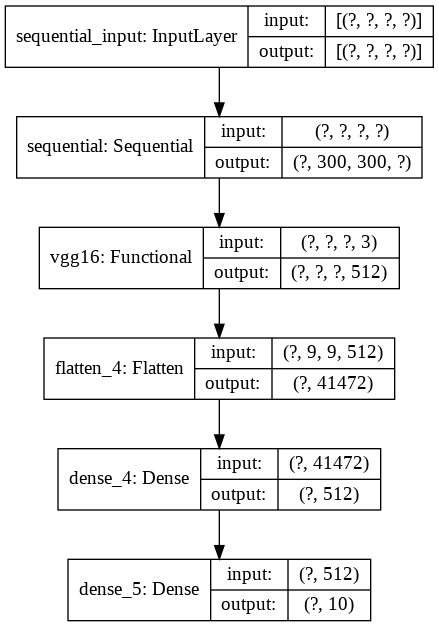

In [58]:
plot_model(model_vgg, to_file='model_vgg_plot.png', show_shapes=True, show_layer_names=True,)

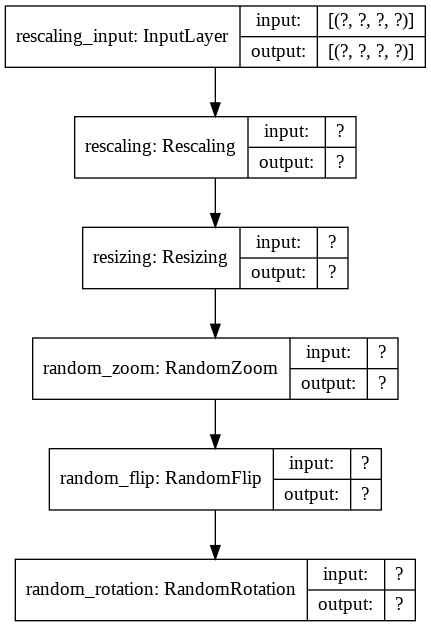

In [61]:
plot_model(augmenting, to_file='augmenting.png',show_shapes=True, show_layer_names=True,)


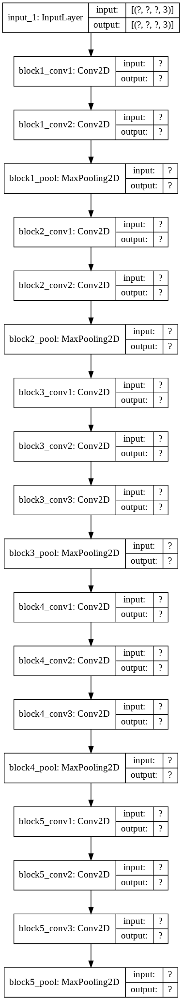

In [62]:
plot_model(vgg, to_file='vgg_plot.png', show_shapes=True, show_layer_names=True,)

In [46]:
def predict_vgg(_img):
  
  
  _img = tf.expand_dims(_img,0)
  res=model_vgg.predict(_img)[0]
  
  top_3=sorted(range(len(classes)), key=lambda i: res[i])[-3:]
  top_3.reverse()
  preds=[]
  for i in top_3:
    preds.append({classes[i]:res[i]*100})
  return preds

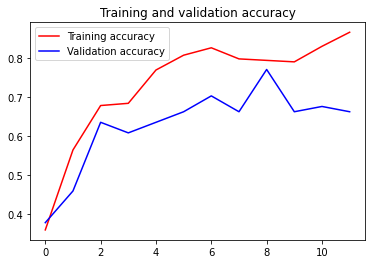

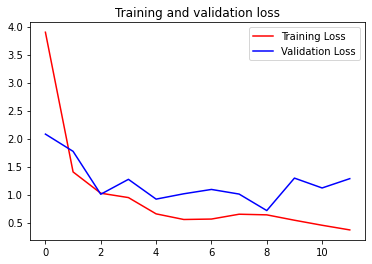

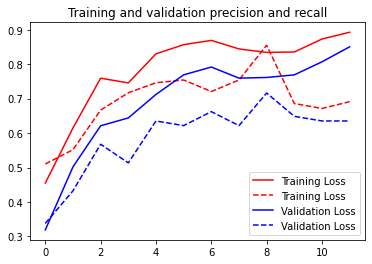

In [53]:
#plotting pretrained model metrices
acc = history_vgg.history['accuracy']
val_acc = history_vgg.history['val_accuracy']
loss = history_vgg.history['loss']
val_loss = history_vgg.history['val_loss']
precision=history_vgg.history['precision']
val_precision=history_vgg.history['val_precision']
recall=history_vgg.history['recall']
val_recall=history_vgg.history['val_recall']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.savefig('model_vgg_acc.png')
plt.figure()

plt.plot(epochs, loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()
plt.savefig('model_vgg_loss.png')
plt.figure()

plt.plot(epochs, precision, 'r', label='Training Loss')
plt.plot(epochs, val_precision, 'r--', label='Training Loss')
plt.plot(epochs, recall, 'b', label='Validation Loss')
plt.plot(epochs, val_recall, 'b--', label='Validation Loss')
plt.title('Training and validation precision and recall')
plt.legend()
plt.savefig('model_vgg_precision_recall.png')

plt.show()

In [49]:
print('accuracy',acc[-1])
print('val_accuracy',val_acc[-1])
print('precision',precision[-1])
print('val_precision',val_precision[-1])
print('recall',recall[-1])
print('val_recall',val_recall[-1])
model_vgg.evaluate_generator(val_generator)

accuracy 0.8655303120613098
val_accuracy 0.662162184715271
precision 0.8926441073417664
val_precision 0.6911764740943909
recall 0.8503788113594055
val_recall 0.6351351141929626


[1.2841216325759888, 0.662162184715271, 0.6911764740943909, 0.6351351141929626]

In [48]:
model_vgg.save('vgg')

INFO:tensorflow:Assets written to: vgg/assets


In [77]:
#downloading flask utilities
!pip install flask-ngrok

In [ ]:
#making flask app

from flask import Flask, render_template, request
from flask_ngrok import run_with_ngrok




In [156]:
#app=Flask(__name__,template_folder='/content/templates')


# from flask import Flask, render_template, request
#from werkzeug import secure_filename
app = Flask(__name__,template_folder='/content/templates')
run_with_ngrok(app)

# @app.route('/upload')
# def upload_file():
#    return render_template('index.html')
	
# @app.route('/uploader', methods = ['GET', 'POST'])
# def uploader():
#    if request.method == 'POST':
#       f = request.files['file']
#       f.save(f.filename)
#       return 'file uploaded successfully'


In [154]:
@app.route('/', methods=['POST','GET'])
def index():
  if request.method=='POST':
    x=request.files['image']
    print(x)
    x=numpy.asarray(x)
    img__=tf.expand_dims(x,0)
    res1=predict_custom(img__)
    res2=preidict_vgg(img__)
    data-{img:x,res1:res1,res2:res2}
    return render_template("predict.html",)
  else:
    return render_template('index.html')

@app.route('/about',methods=['POST','GET'])
def hello():
  retuen render_template("about.html")
    
	


In [155]:
app.run()


 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off


 * Running on http://127.0.0.1:5000/ (Press CTRL+C to quit)


 * Running on http://ca9c9a1f4672.ngrok.io
 * Traffic stats available on http://127.0.0.1:4040


127.0.0.1 - - [01/Nov/2020 00:54:21] "GET / HTTP/1.1" 200 -
127.0.0.1 - - [01/Nov/2020 00:54:21] "GET /favicon.ico HTTP/1.1" 404 -
127.0.0.1 - - [01/Nov/2020 00:54:26] "POST /hello HTTP/1.1" 200 -


hi
ImmutableMultiDict([])


127.0.0.1 - - [01/Nov/2020 00:57:39] "GET / HTTP/1.1" 200 -
127.0.0.1 - - [01/Nov/2020 00:57:46] "POST /hello HTTP/1.1" 200 -


hi
ImmutableMultiDict([])


In [75]:
uploads=files.upload()
for i in uploads:
  _path='/content/'+i
  _img=mpimg.imread(_path)
  _img = tf.expand_dims(_img,0)
  res=model_custom.predict(_img)[0]
  
  top_3=sorted(range(len(classes)), key=lambda i: res[i])[-3:]
  top_3.reverse()
  preds=[]
  for i in top_3:
    preds.append({classes[i]:res[i]*100})
print( preds)

Saving cartoon-boat-with-water-vector-13574299.jpg to cartoon-boat-with-water-vector-13574299 (1).jpg
[{'car': 98.969966173172}, {'scooty': 0.8910945616662502}, {'bus': 0.06297794752754271}]


In [74]:
uploads=files.upload()
for i in uploads:
  _path='/content/'+i
  _img=mpimg.imread(_path)
  _img = tf.expand_dims(_img,0)
  res=model_vgg.predict(_img)[0]
  
  top_3=sorted(range(len(classes)), key=lambda i: res[i])[-3:]
  top_3.reverse()
  preds=[]
  for i in top_3:
    preds.append({classes[i]:res[i]*100})
print( preds)

Saving cartoon-boat-with-water-vector-13574299.jpg to cartoon-boat-with-water-vector-13574299.jpg
[{'boat': 99.64068531990051}, {'car': 0.19691637717187405}, {'bus': 0.08551119826734066}]
